# pre-process data

### * Download the data and verify the variables in each of one of the data sets.

In [1]:
import os
import pandas as pd
import datetime
import seaborn as sns; sns.set_theme(color_codes=True)
import numpy as np
from sklearn.model_selection import train_test_split

In [2]:
pd.set_option('display.max_rows', None, 'display.max_columns', None)

In [3]:
def number_of_columns(path, extension='.xls' ):
    archives = [file for file in os.listdir(path) if extension in file]
    total_columns = []
    print("-----------------------------")
    print("number of Columns")
    print("-----------------------------")
    for archive in archives:
        table = os.path.splitext(archive)[0]
        df = pd.read_excel(path + "/" + archive)
        columns = df.columns.to_list()
        print("the number of columns of the the table "+ str(table) + " are : " + str(len(columns)))
        total_columns.append(set(columns))
    print("-----------------------------")
    print("columns")
    print("-----------------------------")
    for i in range(len(total_columns) - 1):
        table = os.path.splitext(archives[i])[0]
        print("the columns of the table "+ str(table) + " are: ")
        print(total_columns[i])
    intersec_columns = total_columns[0]    
    for i in range(len(total_columns) - 1):
        intersec_columns = intersec_columns.intersection(total_columns[i])
    print("-----------------------------")
    print("mutual columns in all archives")
    print("-----------------------------")
    print(intersec_columns)
    return list(intersec_columns)

In [4]:
working_path = "D:/carlos/Desktop/data/purchasing"

In [5]:
cross_columns = number_of_columns(working_path)

-----------------------------
number of Columns
-----------------------------
the number of columns of the the table 2014-04 are : 12
the number of columns of the the table 2014-05 are : 12
the number of columns of the the table 2014-06 are : 12
the number of columns of the the table 2014-07 are : 12
the number of columns of the the table 2014-08 are : 12
the number of columns of the the table 2014-09 are : 12
the number of columns of the the table 2014-10 are : 12
the number of columns of the the table 2014-11 are : 12
the number of columns of the the table 2014-12 are : 12
the number of columns of the the table 2015-01 are : 11
the number of columns of the the table 2015-02 are : 11
the number of columns of the the table 2015-03 are : 11
the number of columns of the the table 2015-05 are : 11
the number of columns of the the table 2015-06 are : 11
the number of columns of the the table 2015-07 are : 11
the number of columns of the the table 2015-08 are : 11
the number of columns of t

the funtion upper permits unify the naming convention in all splited data sets, for example: I find two different name variables for the same variable in different datasets("Directorate" and "Directorates"), then I could unify the data structure before unify all the splited data in a unic data set. Additionally the function calculates the cross columns of the entire data set set.

### * Unification in a single data set

In [6]:
def create_ouput_path(path):
    if not os.path.exists(path):
        os.makedirs(path)

In [7]:
def unification_data(input_path, cross_columns, output_path):
    archives = [file for file in os.listdir(input_path) if '.xls' in file]
    splited_data = []
    for archive in archives:
        table = os.path.splitext(archive)[0]
        df = pd.read_excel(input_path + "/" + archive)[cross_columns]
        splited_data.append(df)
        print("the volume information for the table " + str(table) + " is: " + str(df.shape[0]))
    unified_data_df = pd.DataFrame(columns=cross_columns)
    total_row_number = 0
    for data in splited_data:
        unified_data_df = pd.concat([unified_data_df, data])
        volume_data = data.shape[0]
        total_row_number = total_row_number + volume_data
    print("the total of registers in the data must be " + str(total_row_number))
    print("the total of registers in the unified data is: " + str(unified_data_df.shape[0]))
    if unified_data_df.shape[0] == total_row_number:
        create_ouput_path(output_path)
        unified_data_df.to_csv(output_path + "/unified_data.csv", header=True, sep=";", index=False)
    return unified_data_df    

In [8]:
output_unified_info = "D:/carlos/Desktop/data/purchasing_unified"

In [9]:
unified_df = unification_data(working_path, cross_columns, output_unified_info)

the volume information for the table 2014-04 is: 2690
the volume information for the table 2014-05 is: 4573
the volume information for the table 2014-06 is: 4573
the volume information for the table 2014-07 is: 4015
the volume information for the table 2014-08 is: 2365
the volume information for the table 2014-09 is: 4154
the volume information for the table 2014-10 is: 3781
the volume information for the table 2014-11 is: 5023
the volume information for the table 2014-12 is: 3293
the volume information for the table 2015-01 is: 4791
the volume information for the table 2015-02 is: 3959
the volume information for the table 2015-03 is: 4586
the volume information for the table 2015-05 is: 3926
the volume information for the table 2015-06 is: 4744
the volume information for the table 2015-07 is: 3651
the volume information for the table 2015-08 is: 2062
the volume information for the table 2015-09 is: 4421
the volume information for the table 2015-10 is: 4128
the volume information for t

### * analysis basic data sructure

first at all we have to know the data schema for be shure that the data schema corresponds to the real information schema types

In [10]:
unified_df.dtypes

TRANS CAC CODE 2              object
TRANS CAC DESC 2              object
TRANS DATE            datetime64[ns]
Directorate                   object
MERCHANT NAME                 object
TRANS CAC CODE 1              object
TRANS VAT DESC                object
TRANS CAC DESC 1              object
CARD NUMBER                   object
ORIGINAL GROSS AMT           float64
TRANS CAC CODE 3              object
dtype: object

In [11]:
unified_df.head()

,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS DATE,Directorate,MERCHANT NAME,TRANS CAC CODE 1,TRANS VAT DESC,TRANS CAC DESC 1,CARD NUMBER,ORIGINAL GROSS AMT,TRANS CAC CODE 3
0,RV12N,African-Caribbean DC,2014-04-29,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,52.32,A00
1,RV12N,African-Caribbean DC,2014-04-04,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,65.82,A00
2,RV11Y,"Marsh Lane Dce, 79, B23",2014-04-07,Adult & Communities,tesco pfs 2484,K020,VR,Vehicle Fuel,************8738,41.35,A00
3,RV1K1,Elders Group - Erdington,2014-04-25,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,47.19,A00
4,RV1K1,Elders Group - Erdington,2014-04-24,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,98.08,A00


In this case we can be shure of the data types present in the infered schema by pandas.

# descriptive stadistics for the original valriables present in the dataset

In [12]:
unified_df[["CARD NUMBER", "TRANS CAC CODE 2", "ORIGINAL GROSS AMT", "MERCHANT NAME", "TRANS CAC DESC 2", "TRANS CAC CODE 3", "TRANS VAT DESC", "TRANS CAC CODE 1", "TRANS CAC DESC 1", "Directorate"]].describe(include="all")

,CARD NUMBER,TRANS CAC CODE 2,ORIGINAL GROSS AMT,MERCHANT NAME,TRANS CAC DESC 2,TRANS CAC CODE 3,TRANS VAT DESC,TRANS CAC CODE 1,TRANS CAC DESC 1,Directorate
count,185908,185673,185908.000000,185908,185673,185616,176065,185804,185804,185171
unique,1523,1397,NaN,15856,1382,28,7,143,143,18
top,************6308,RUF0F,NaN,amazon uk marketplace,Illegal Money Lending T Stds Comm Inv.,A00,VR,L100,Equip Operational,CYP&F SCHOOLS
freq,2676,13839,NaN,14967,13839,183654,88065,34433,34433,87532
mean,NaN,NaN,176.607761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,2133.811542,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,-486980.090000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,12.790000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,40.480000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,92.230000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
def trim_columns(df, col_list):
    for column in col_list:
        df[column] = df[column].str.strip() 

In [14]:
unified_df["TRANS CAC DESC 1"].str.strip().unique()

array(['Vehicle Fuel', 'Training Other', 'Computing Other',
       'Vehicle Excise Lics', 'Equip Other', 'Vehicle R&M', 'Books',
       'Staff Advert Exp', 'Equip Operational', 'Supplies & Sev Mic',
       'Stationery', 'Purchases Food', 'Bldg RM Departmental',
       'Travel Bus/Rail', 'Hospitality', 'Vehicle OthrunCosts',
       'Ttavel Other (UK)', 'Photocopying', "Mat'l Raw/Drct", 'Postage',
       'Travel Taxis', 'Prof Fees other', 'Other Fix&Fittings',
       'Conference Fees Subs Foreign', 'Conference Fees Subs UK',
       'Legal Fee Other', 'Equip Office', 'Electricity',
       'Car Allowances etc', 'Travel Foreign', "N'Papers&Periodicals",
       'Phon NonCentrx Lines', 'Visits Expenditure', 'Other Services',
       'Personal Needs', 'Clothing&Uniforms', 'HR&M Door Entry',
       'Equip Maintenance', 'Licences & Permits', 'Stock Misc',
       'Cleaning Materials', 'Subscriptions', 'Grounds Maintenance',
       'Bldg RM Fair Fund NS', 'Bldg RM Routine UDD', "Signs & N'boards",


In [15]:
unified_df["Directorate"].unique()

array(['Adult & Communities', 'Adults & Comms', 'Corporate Resources',
       'CYP&F', 'CYP&F  ', 'CYP&F SCHOOLS', 'CYP&F Schools',
       'DEVELOPMENT', 'Local Services', 'Development',
       'Adults & Communities', 'Local services', 'CYO&F',
       'Corporate Procurement', 'Adults', 'CYP&F ', ' ', nan,
       'Adult Social Care and Health'], dtype=object)

I found that I have to trim the string data for remove duplicated buckets

In [16]:
trim_columns(unified_df, ["CARD NUMBER", "TRANS CAC CODE 2", "MERCHANT NAME", "TRANS CAC DESC 2", "TRANS CAC CODE 3", "TRANS VAT DESC", "TRANS CAC CODE 1", "TRANS CAC DESC 1", "Directorate"])

In [17]:
unified_df["Directorate"].unique()

array(['Adult & Communities', 'Adults & Comms', 'Corporate Resources',
       'CYP&F', 'CYP&F SCHOOLS', 'CYP&F Schools', 'DEVELOPMENT',
       'Local Services', 'Development', 'Adults & Communities',
       'Local services', 'CYO&F', 'Corporate Procurement', 'Adults', '',
       nan, 'Adult Social Care and Health'], dtype=object)

confirmation that the repeated buckets are droped

## Time analisis of the general portafolio movement

Generation of the segmentation month buckects in the month_year variable

In [18]:
unified_df['month_year'] = pd.to_datetime(unified_df["TRANS DATE"]).dt.to_period('M')

In [19]:
unified_df.head()

,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS DATE,Directorate,MERCHANT NAME,TRANS CAC CODE 1,TRANS VAT DESC,TRANS CAC DESC 1,CARD NUMBER,ORIGINAL GROSS AMT,TRANS CAC CODE 3,month_year
0,RV12N,African-Caribbean DC,2014-04-29,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,52.32,A00,2014-04
1,RV12N,African-Caribbean DC,2014-04-04,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,65.82,A00,2014-04
2,RV11Y,"Marsh Lane Dce, 79, B23",2014-04-07,Adult & Communities,tesco pfs 2484,K020,VR,Vehicle Fuel,************8738,41.35,A00,2014-04
3,RV1K1,Elders Group - Erdington,2014-04-25,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,47.19,A00,2014-04
4,RV1K1,Elders Group - Erdington,2014-04-24,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,98.08,A00,2014-04


In [20]:
unified_df.dtypes

TRANS CAC CODE 2              object
TRANS CAC DESC 2              object
TRANS DATE            datetime64[ns]
Directorate                   object
MERCHANT NAME                 object
TRANS CAC CODE 1              object
TRANS VAT DESC                object
TRANS CAC DESC 1              object
CARD NUMBER                   object
ORIGINAL GROSS AMT           float64
TRANS CAC CODE 3              object
month_year                 period[M]
dtype: object

generation of the time series for the general portafolio movement

In [21]:
month_spend_df = unified_df[["ORIGINAL GROSS AMT", "month_year"]].groupby(by=["month_year"]).agg(["sum", "mean", "count"])

In [22]:
month_spend_df

ORIGINAL GROSS AMT                  
                          sum        mean count
month_year                                     
2013-11               -594.00 -594.000000     1
2014-03                 87.79   43.895000     2
2014-04             476223.42  185.734563  2564
2014-05              50967.22  389.062748   131
2014-06            1139491.18  135.750677  8394
2014-07             671231.71  140.336966  4783
2014-08             486018.34  222.739844  2182
2014-09             623918.72  154.741746  4032
2014-10             617578.24  154.009536  4010
2014-11             614956.59  131.372910  4681
2014-12             921519.00  249.598862  3692
2015-01             742455.47  160.774246  4618
2015-02             725948.61  185.002194  3924
2015-03             490640.13  106.568230  4604
2015-04              10060.16   48.366154   208
2015-05             587172.04  164.197998  3576
2015-06             703963.12  151.618161  4643
2015-07             662276.36  163.082088  4061
2015-08             268454.82  139.167869  1929
2015-09             548672.10  124.387236  4411
2015-10             725341.24  176.139203  4118
2015-11             794948.99  156.794673  5070
2015-12             373018.08  104.457597  3571
2016-01             689053.24  149.631540  4605
2016-02             768151.71  164.627456  4666
2016-03             603437.58  150.258362  4016
2016-04             398235.34  104.826360  3799
2016-05             759880.91  167.670104  4532
2016-06             822897.07  159.941121  5145
2016-07             900845.55  179.845388  5009
2016-08             721944.62  276.183864  2614
2016-09             803983.19  153.023066  5254
2016-10             657852.98  152.069575  4326
2016-11             888243.28  167.057228  5317
2016-12             518076.79  162.763679  3183
2017-01             495074.59  102.478698  4831
2017-02            1077321.71  274.337079  3927
2017-03             916938.23  202.325293  4532
2017-04             588814.63  197.191772  2986
2017-05             306976.38   57.335895  5354
2017-06             883894.00  176.637490  5004
2017-07            1119641.97  221.975014  5044
2017-08             947605.51  383.025671  2474
2017-09            1304283.32  296.360673  4401
2017-10            1326279.39  301.907441  4393
2017-11            1502364.40  265.999363  5648
2017-12                147.28   12.273333    12
2018-01            1286969.51  263.669230  4881
2018-02             309533.05  412.710733   750

short hand stadistics for the monthy time series

In [23]:
month_spend_df.describe()

ORIGINAL GROSS AMT                         
                     sum        mean        count
count       4.900000e+01   49.000000    49.000000
mean        6.700571e+05  164.284162  3794.040816
std         3.500648e+05  138.209747  1709.340881
min        -5.940000e+02 -594.000000     1.000000
25%         4.906401e+05  139.167869  3183.000000
50%         6.712317e+05  162.763679  4326.000000
75%         8.838940e+05  202.325293  4783.000000
max         1.502364e+06  412.710733  8394.000000

### * Transactional volumetry analysis

<AxesSubplot:ylabel='count'>

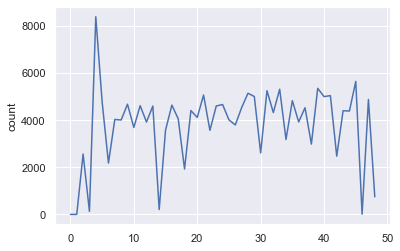

In [24]:
month_total_count_df = month_spend_df[[('ORIGINAL GROSS AMT',   'count')]].reset_index(inplace=False)
month_total_count_df.columns = ["month_year", "count"]
sns.lineplot(x=month_total_count_df.index, y="count", data=month_total_count_df)

We can find that the low volume information for 2015-04 is a consecuence that this month is did not find in the complete data set in  the official page.

In [25]:
month_total_count_df[["count"]].mean()

count    3794.040816
dtype: float64

the mean number of transactions per month is 3794.04

### * Historically mean spend

<AxesSubplot:ylabel='avr_spend'>

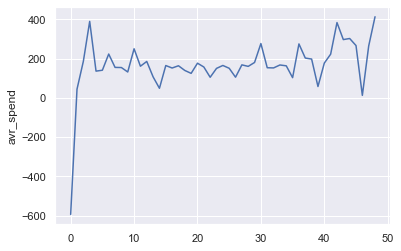

In [26]:
month_mean_spend_df = month_spend_df[[('ORIGINAL GROSS AMT',   'mean')]].reset_index(inplace=False)
month_mean_spend_df.columns = ["month_year", "avr_spend"]
sns.lineplot(x=month_mean_spend_df.index, y="avr_spend", data=month_mean_spend_df)

In [27]:
month_mean_spend_df[["avr_spend"]].mean()

avr_spend    164.284162
dtype: float64

the mean spend in the transactions per month is 164.28

### * Historically total amount spend per month

<AxesSubplot:ylabel='sum'>

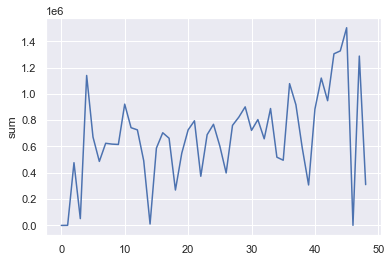

In [28]:
month_total_spend_df = month_spend_df[[('ORIGINAL GROSS AMT',   'sum')]].reset_index(inplace=False)
month_total_spend_df.columns = ["month_year", "sum"]
sns.lineplot(x=month_total_spend_df.index, y="sum", data=month_total_spend_df)

In [29]:
month_total_spend_df[["sum"]].mean()

sum    670057.052245
dtype: float64

The average total spend per month is 670057.052

## comportament of the directorate along the time

First at all I am interested to Know the "Directorate" comportament along the time. Thats help to infer if all the directorate buckets expend money all the months.

In [30]:
directorate_selected_df = unified_df[["Directorate", "ORIGINAL GROSS AMT", "month_year"]]
directorate_time_1_df = directorate_selected_df.groupby(by=["Directorate", "month_year"]).agg(["sum", "mean", "count"])
directorate_full_time = directorate_selected_df[["Directorate", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate"]).agg(["sum", "mean", "count", "var"])

In [31]:
directorate_full_time.columns = ["sum", "mean", "count", "var"]

In [32]:
directorate_full_time = directorate_full_time.reset_index(inplace=False)

In [33]:
directorate_full_time

,Directorate,sum,mean,count,var
0,,0.000000e+00,NaN,0,NaN
1,Adult & Communities,2.772239e+06,224.164214,12367,1.915001e+05
2,Adult Social Care and Health,9.138591e+04,162.031755,564,1.753789e+06
3,Adults,1.468920e+03,61.205000,24,3.466535e+02
4,Adults & Comms,1.232914e+04,241.747843,51,2.729703e+05
5,Adults & Communities,5.860130e+03,366.258125,16,6.983458e+04
6,CYO&F,4.098560e+03,44.070538,93,1.429891e+02
7,CYP&F,1.768911e+06,70.356823,25142,1.617064e+04
8,CYP&F SCHOOLS,7.151069e+06,81.696624,87532,1.106225e+05
9,CYP&F Schools,3.855528e+04,83.998431,459,2.057295e+04


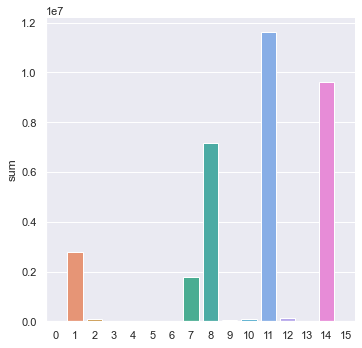

In [34]:
sns.catplot(x=directorate_full_time.index, y="sum", kind="bar", data=directorate_full_time)

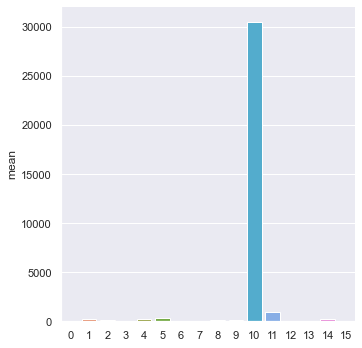

In [35]:
sns.catplot(x=directorate_full_time.index, y="mean", kind="bar", data=directorate_full_time)

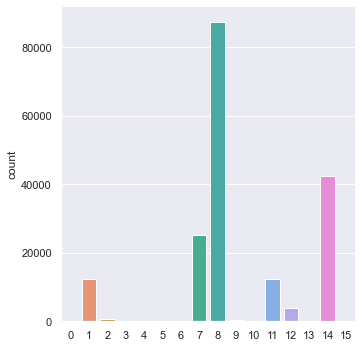

In [36]:
sns.catplot(x=directorate_full_time.index, y="count", kind="bar", data=directorate_full_time)

In [37]:
directorate_time_1_df

ORIGINAL GROSS AMT                    
                                                       sum          mean count
Directorate                  month_year                                       
Adult & Communities          2013-11               -594.00   -594.000000     1
                             2014-04              21679.45     93.850433   231
                             2014-05                500.25     71.464286     7
                             2014-06              29344.76     59.643821   492
                             2014-07              16302.63     60.604572   269
                             2014-08              14301.50     63.562222   225
                             2014-09              17066.31     62.975314   271
                             2014-10              19727.23     67.559007   292
                             2014-11              14198.85     58.192008   244
                             2014-12              13035.65     57.936222   225
                             2015-01              16352.31     67.017664   244
                             2015-02              12382.57     57.593349   215
                             2015-03              13857.78     54.131953   256
                             2015-04               1901.45    118.840625    16
                             2015-05              16387.39     76.576589   214
                             2015-06              16118.72     63.210667   255
                             2015-07              14742.36     57.140930   258
                             2015-08              11114.66     54.483627   204
                             2015-09              15021.00     69.221198   217
                             2015-10              20416.39     75.060257   272
                             2015-11              37226.08    138.386914   269
                             2015-12              14423.41     78.388098   184
                             2016-01              39324.60    124.052366   317
                             2016-02             171420.77    288.587155   594
                             2016-03             126419.08    257.472668   491
                             2016-04             246035.01    433.924180   567
                             2016-05             275871.11    516.612566   534
                             2016-06             355641.43    512.451628   694
                             2016-07             279127.83    496.668737   562
                             2016-08             418106.87    634.456555   659
                             2016-09             371342.57    566.935221   655
                             2016-10              16277.14     67.821417   240
                             2016-11              14093.70     57.998765   243
                             2016-12              11040.24     57.203316   193
                             2017-01              15259.75     67.821111   225
                             2017-02              14791.77     72.508676   204
                             2017-03              12686.27     56.133938   226
                             2017-04              12346.70     69.363483   178
                             2017-05              12047.01     66.192363   182
                             2017-06              10268.57     54.912139   187
                             2017-07              11810.69     58.468762   202
                             2017-08              12556.55     68.615027   183
                             2017-09               9920.93     60.493476   164
                             2017-10                343.49     57.248333     6
Adult Social Care and Health 2017-10              10813.78     57.520106   188
                             2017-11              15617.09     86.761611   180
                             2018-01              23718.24    139.519059   170
                             2018-02              41236.80   1586.030769    26
Adults     

In [38]:
directorate_time_1_df.describe()

ORIGINAL GROSS AMT                           
                     sum          mean        count
count       3.870000e+02    387.000000   387.000000
mean        8.603707e+04    288.954153   478.475452
std         1.492189e+05   1594.453190   687.653961
min        -1.923191e+05  -2262.577529     1.000000
25%         1.037720e+03     59.966969    11.500000
50%         2.041639e+04     74.910344   225.000000
75%         1.091553e+05    117.118912   615.500000
max         1.023197e+06  30514.943333  4384.000000

In [39]:
directorate_time_2_df = directorate_selected_df.groupby(by=["month_year", "Directorate"]).agg(["sum", "mean", "count"])

In [40]:
directorate_time_2_df

ORIGINAL GROSS AMT                    
                                                       sum          mean count
month_year Directorate                                                        
2013-11    Adult & Communities                     -594.00   -594.000000     1
2014-03    CYP&F SCHOOLS                            -10.54    -10.540000     1
           Local Services                            98.33     98.330000     1
2014-04    Adult & Communities                    21679.45     93.850433   231
           Adults & Comms                          1732.66    866.330000     2
           CYP&F                                  27170.94     57.687771   471
           CYP&F SCHOOLS                          97660.44    117.239424   833
           CYP&F Schools                            574.59     82.084286     7
           Corporate Resources                   270416.14   1150.706979   235
           DEVELOPMENT                             9811.40     83.858120   117
           Local Services                         47177.80     70.625449   668
2014-05    Adult & Communities                      500.25     71.464286     7
           CYP&F                                   1152.93     57.646500    20
           CYP&F SCHOOLS                           4241.41     75.739464    56
           Corporate Resources                    42329.58   2821.972000    15
           DEVELOPMENT                              307.95     76.987500     4
           Local Services                          2435.10     83.968966    29
2014-06    Adult & Communities                    29344.76     59.643821   492
           Adults & Communities                    1305.56    326.390000     4
           CYP&F                                  62468.42     54.320365  1150
           CYP&F SCHOOLS                         365146.16     83.290639  4384
           CYP&F Schools                           2965.54     92.673125    32
           Corporate Resources                   540198.56   1080.397120   500
           DEVELOPMENT                            25254.90     91.503261   276
           Development                              222.62    111.310000     2
           Local Services                        112584.66     72.448301  1554
2014-07    Adult & Communities                    16302.63     60.604572   269
           Adults & Comms                          1771.91    221.488750     8
           Adults & Communities                     455.56    227.780000     2
           CYP&F                                  58076.88     65.401892   888
           CYP&F SCHOOLS                         196902.16     97.235635  2025
           CYP&F Schools                           2685.58     92.606207    29
           Corporate Resources                   296205.76   1028.492222   288
           DEVELOPMENT                            12927.45     93.677174   138
           Local Services                         85634.78     75.449145  1135
           Local services                           269.00    269.000000     1
2014-08    Adult & Communities                    14301.50     63.562222   225
           Adults & Comms                           194.15     32.358333     6
           CYP&F                                  38321.48     64.405849   595
           CYP&F SCHOOLS                          25319.13     74.687699   339
           Corporate Resources                   348089.35   1349.183527   258
           DEVELOPMENT                            11967.42     81.411020   147
           Local Services                         47825.31     78.145931   612
2014-09    Adult & Communities                    17066.31     62.975314   271
           Adults & Comms                          1211.60    302.900000     4
           CYP&F                                  27022.35     62.407275   433
           CYP&F SCHOOLS                         165922.41     85.571124  1939
           Corporate Resources                   325761.71   1308.279960   249
           

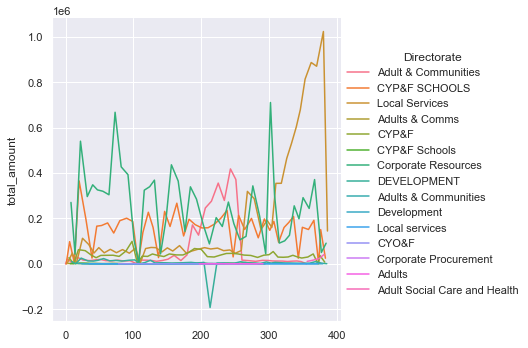

In [41]:
directorate_time_plot_total_amount_df = directorate_time_2_df[[('ORIGINAL GROSS AMT',   'sum')]].reset_index(inplace=False)
directorate_time_plot_total_amount_df.columns = ["month_year", "Directorate", "total_amount"]
sns.relplot(x=directorate_time_plot_total_amount_df.index, y="total_amount", hue="Directorate", kind="line", data=directorate_time_plot_total_amount_df)

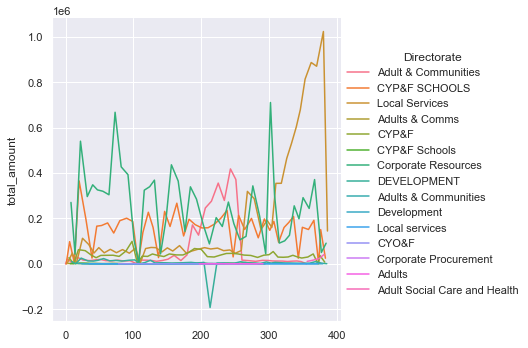

In [42]:
directorate_time_plot_avg_amount_df = directorate_time_2_df[[('ORIGINAL GROSS AMT',   'sum')]].reset_index(inplace=False)
directorate_time_plot_avg_amount_df.columns = ["month_year", "Directorate", "total_amount"]
sns.relplot(x=directorate_time_plot_avg_amount_df.index, y="total_amount", hue="Directorate", kind="line", data=directorate_time_plot_avg_amount_df)

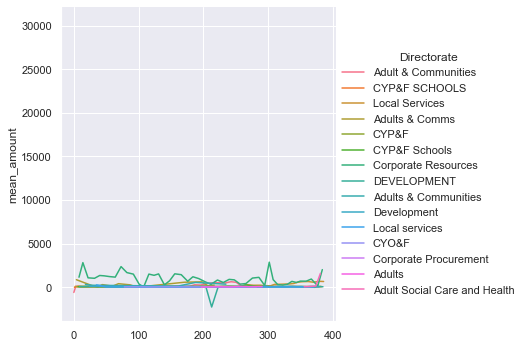

In [43]:
directorate_time_plot_total_amount_df = directorate_time_2_df[[('ORIGINAL GROSS AMT',   'mean')]].reset_index(inplace=False)
directorate_time_plot_total_amount_df.columns = ["month_year", "Directorate", "mean_amount"]
sns.relplot(x=directorate_time_plot_total_amount_df.index, y="mean_amount", hue="Directorate", kind="line", data=directorate_time_plot_total_amount_df)

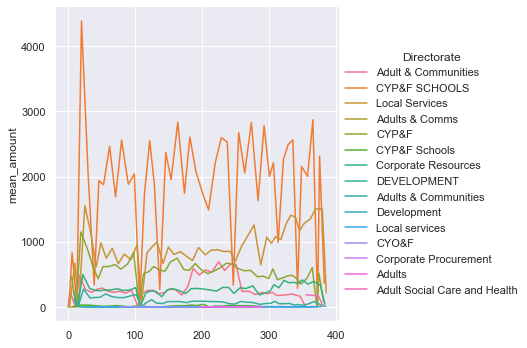

In [44]:
directorate_time_plot_count_df = directorate_time_2_df[[('ORIGINAL GROSS AMT',   'count')]].reset_index(inplace=False)
directorate_time_plot_count_df.columns = ["month_year", "Directorate", "mean_amount"]
sns.relplot(x=directorate_time_plot_count_df.index, y="mean_amount", hue="Directorate", kind="line", data=directorate_time_plot_count_df)

### comportament of the spend by category

In [45]:
trans_cac_desc_1_selected_df = unified_df[["TRANS CAC DESC 1", "ORIGINAL GROSS AMT", "month_year"]]
trans_cac_desc_1_time_1_df = trans_cac_desc_1_selected_df.groupby(by=["TRANS CAC DESC 1", "month_year"]).agg(["sum", "mean", "count"])
trans_cac_desc_full_time = trans_cac_desc_1_selected_df[["TRANS CAC DESC 1", "ORIGINAL GROSS AMT"]].groupby(by=["TRANS CAC DESC 1"]).agg(["sum", "mean", "count"])

In [46]:
trans_cac_desc_full_time.columns = ["sum", "mean", "count"]
trans_cac_desc_full_time = trans_cac_desc_full_time.reset_index(inplace=False)

In [47]:
trans_cac_desc_full_time

,TRANS CAC DESC 1,sum,mean,count
0,AMO - Lighting,1.376800e+02,137.680000,1
1,AS Unaccmpnd Minors,1.187510e+03,131.945556,9
2,Accomodation Hire,3.258630e+04,285.844737,114
3,Advertising NonStaff,1.027712e+04,103.809293,99
4,Aftercare Assistance,1.560347e+05,193.112240,808
5,Audit Fees,1.300000e+01,13.000000,1
6,Autopsy Fees,6.594000e+01,16.485000,4
7,Bank & Goro ChgsS,1.205764e+05,202.990657,594
8,Bldg R&M Strat UDD,5.541500e+02,277.075000,2
9,Bldg RM Departmental,2.970542e+05,79.468753,3738


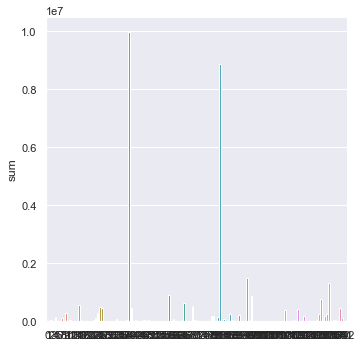

In [48]:
sns.catplot(x=trans_cac_desc_full_time.index, y="sum", kind="bar", data=trans_cac_desc_full_time)

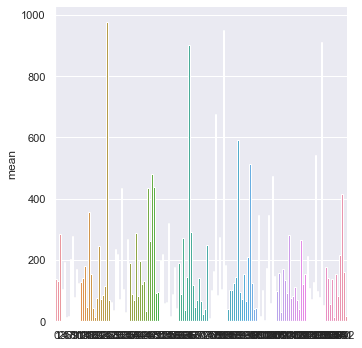

In [49]:
sns.catplot(x=trans_cac_desc_full_time.index, y="mean", kind="bar", data=trans_cac_desc_full_time)

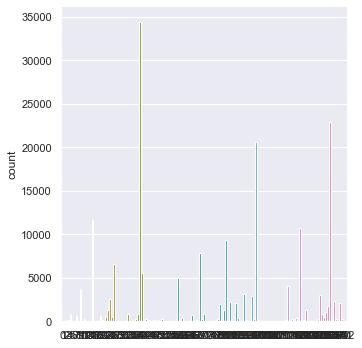

In [50]:
sns.catplot(x=trans_cac_desc_full_time.index, y="count", kind="bar", data=trans_cac_desc_full_time)

In [51]:
trans_cac_desc_1_time_1_df

ORIGINAL GROSS AMT                    
                                                       sum          mean count
TRANS CAC DESC 1             month_year                                       
AMO - Lighting               2016-10                137.68    137.680000     1
AS Unaccmpnd Minors          2015-08                778.08    259.360000     3
                             2017-01                112.43    112.430000     1
                             2017-07                105.00     35.000000     3
                             2017-11                192.00     96.000000     2
Accomodation Hire            2014-06                754.54    188.635000     4
                             2014-08                 98.65     98.650000     1
                             2014-10                940.00    313.333333     3
                             2014-11               1178.52    589.260000     2
                             2014-12                342.00    342.000000     1
                             2015-03                578.50    289.250000     2
                             2015-06               1491.80    372.950000     4
                             2015-07               1954.70    195.470000    10
                             2015-08               1889.20    377.840000     5
                             2015-09               1481.70    370.425000     4
                             2015-10                393.20    393.200000     1
                             2015-11               6838.85    310.856818    22
                             2015-12               1337.15    668.575000     2
                             2016-01               6818.35    235.115517    29
                             2016-03                473.40    236.700000     2
                             2016-04                 40.00     40.000000     1
                             2016-07                442.49    221.245000     2
                             2016-09                264.00    264.000000     1
                             2016-12                568.00    189.333333     3
                             2017-01                240.00    240.000000     1
                             2017-03                294.00    147.000000     2
                             2017-05                288.00    288.000000     1
                             2017-06                948.00    948.000000     1
                             2017-07                215.00    215.000000     1
                             2017-09                 85.60     85.600000     1
                             2017-10                208.20    208.200000     1
                             2018-01               2422.45    346.064286     7
Advertising NonStaff         2014-04                225.00    225.000000     1
                             2014-06                 36.00      9.000000     4
                             2014-07                580.00    290.000000     2
                             2014-08                195.60    195.600000     1
                             2014-09                 26.00     26.000000     1
                             2014-10                615.24    153.810000     4
                             2015-01                351.48    175.740000     2
                             2015-02                 24.00     24.000000     1
                             2015-03                294.50    294.500000     1
                             2015-05                198.77     33.128333     6
                             2015-06                 89.61     44.805000     2
                             2015-07               -106.20   -106.200000     1
                             2015-08                 92.94     92.940000     1
                             2015-09                 90.00     90.000000     1
                             2015-10                121.27     60.635000     2
                             2015-11                 90.00     90.000000     1
           

In [52]:
trans_cac_desc_1_time_2_df = trans_cac_desc_1_selected_df.groupby(by=["month_year", "TRANS CAC DESC 1"]).agg(["sum", "mean", "count"])

In [53]:
trans_cac_desc_1_time_2_df

ORIGINAL GROSS AMT                    
                                                       sum          mean count
month_year TRANS CAC DESC 1                                                   
2013-11    Equip Operational                       -594.00   -594.000000     1
2014-03    Purchases Food                           -10.54    -10.540000     1
           Vehicle Fuel                              98.33     98.330000     1
2014-04    Advertising NonStaff                     225.00    225.000000     1
           Bank & Goro ChgsS                       2700.00    675.000000     4
           Bldg RM Departmental                    2794.79     73.547105    38
           Bldg RM Emergy UDD                       184.80    184.800000     1
           Bldg RM Fair Fund NS                     146.38    146.380000     1
           Bldg RM Routine UDD                      307.42    153.710000     2
           Books                                   5269.48     35.846803   147
           Car Allowances etc                        30.06     30.060000     1
           Car Parking                               40.20      5.742857     7
           Cleaning Materials                       269.05     38.435714     7
           Clothing&Uniforms                       1029.94     85.828333    12
           Computing Other                         4782.76    132.854444    36
           Conference Fees Subs Foreign            2475.24    206.270000    12
           Conference Fees Subs UK                 6912.03     72.758211    95
           Disinfestation                            31.97     31.970000     1
           Electricity                             2070.40   1035.200000     2
           Equip Maintenance                        463.59    231.795000     2
           Equip Office                             412.49     37.499091    11
           Equip Operational                     201000.65    695.503979   289
           Equip Other                            12645.28    185.960000    68
           GoodsPurchforResale                     2106.26    702.086667     3
           Grounds Maintenance                      144.99     72.495000     2
           HR&M Door Entry                           18.99     18.990000     1
           Hospitality                            16220.90    184.328409    88
           Legal Fee Other                        64008.82   1488.577209    43
           Licences & Permits                       291.00    145.500000     2
           Mat'l Raw/Drct                          6729.94     64.094667   105
           Mobiles/Radios/Pagrs                      16.01     16.010000     1
           N'Papers&Periodicals                    1630.01    101.875625    16
           Oth Indirect EmpExps                      80.99     26.996667     3
           Other Agencies                          1729.00    864.500000     2
           Other Fix&Fittings                       664.95     73.883333     9
           Other Services                           759.83     50.655333    15
           Personal Needs                           730.60     25.193103    29
           Phon NonCentrx Lines                    2968.59     98.953000    30
           Photocopying                             339.36     84.840000     4
           Postage                                 4021.98     58.289565    69
           Premises Provisions                       23.27     11.635000     2
           Prof Fees other                         3246.89    135.287083    24
           Promotions/Marketing                     100.00    100.000000     1
           Purchases Food                         14550.89     37.502294   388
           Signs & N'boards                          29.94     29.940000     1
           Staff Advert Exp                          44.60      7.433333     6
           Stationery                              5421.76    115.356596    47
           Stock Misc                                80.00     80.000000     1
           

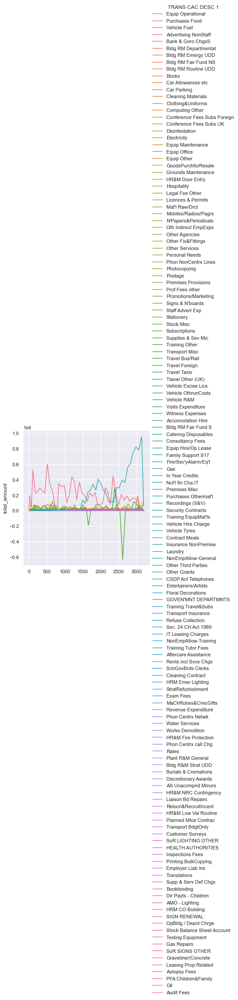

In [54]:
category_time_plot_total_amount_df = trans_cac_desc_1_time_2_df[[('ORIGINAL GROSS AMT',   'sum')]].reset_index(inplace=False)
category_time_plot_total_amount_df.columns = ["month_year", "TRANS CAC DESC 1", "total_amount"]
sns.relplot(x=category_time_plot_total_amount_df.index, y="total_amount", hue="TRANS CAC DESC 1", kind="line", data=category_time_plot_total_amount_df)

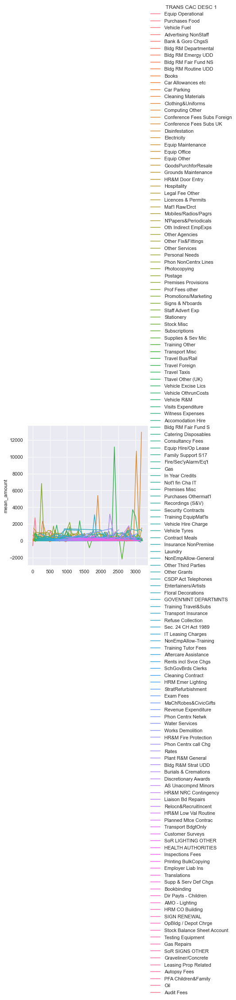

In [55]:
category_time_plot_total_amount_df = trans_cac_desc_1_time_2_df[[('ORIGINAL GROSS AMT',   'mean')]].reset_index(inplace=False)
category_time_plot_total_amount_df.columns = ["month_year", "TRANS CAC DESC 1", "mean_amount"]
sns.relplot(x=category_time_plot_total_amount_df.index, y="mean_amount", hue="TRANS CAC DESC 1", kind="line", data=category_time_plot_total_amount_df)

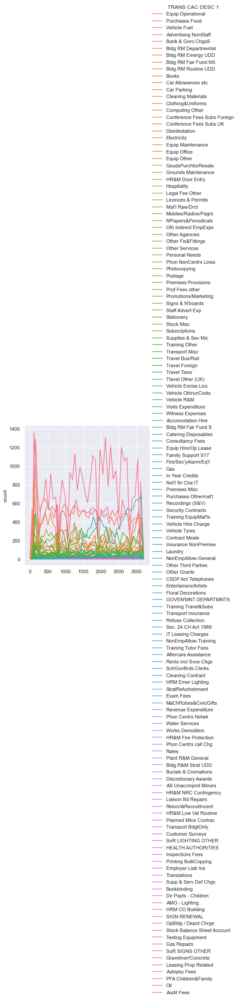

In [56]:
category_time_plot_total_amount_df = trans_cac_desc_1_time_2_df[[('ORIGINAL GROSS AMT',   'count')]].reset_index(inplace=False)
category_time_plot_total_amount_df.columns = ["month_year", "TRANS CAC DESC 1", "count"]
sns.relplot(x=category_time_plot_total_amount_df.index, y="count", hue="TRANS CAC DESC 1", kind="line", data=category_time_plot_total_amount_df)

### historically report of spends by month directorate and category

In [57]:
unified_df[["Directorate", "TRANS CAC DESC 1", "month_year", "ORIGINAL GROSS AMT"]].groupby(by=["month_year", "Directorate", "TRANS CAC DESC 1"]).agg(["sum", "mean", "count"])

ORIGINAL GROSS AMT  \
                                                                                    sum   
month_year Directorate                  TRANS CAC DESC 1                                  
2013-11    Adult & Communities          Equip Operational                       -594.00   
2014-03    CYP&F SCHOOLS                Purchases Food                           -10.54   
           Local Services               Vehicle Fuel                              98.33   
2014-04    Adult & Communities          Bldg RM Departmental                      26.94   
                                        Books                                      8.26   
                                        Computing Other                          397.64   
                                        Equip Operational                        155.54   
                                        Equip Other                             7662.60   
                                        Purchases Food                           179.88   
                                        Staff Advert Exp                           6.99   
                                        Stationery                               515.00   
                                        Supplies & Sev Mic                     -1174.42   
                                        Training Other                           157.00   
                                        Vehicle Excise Lics                      420.00   
                                        Vehicle Fuel                           12874.02   
                                        Vehicle R&M                              450.00   
           Adults & Comms               Equip Operational                       1732.66   
           CYP&F                        Bldg RM Departmental                     621.46   
                                        Books                                    224.63   
                                        Clothing&Uniforms                        434.70   
                                        Computing Other                          319.28   
                                        Equip Maintenance                        150.34   
                                        Equip Operational                       2565.97   
                                        Equip Other                             1394.50   
                                        HR&M Door Entry                           18.99   
                                        Hospitality                             1974.14   
                                        Mat'l Raw/Drct                           746.38   
                                        N'Papers&Periodicals                      41.60   
                                        Other Fix&Fittings                        40.00   
                                        Other Services                           411.80   
                                        Personal Needs                           730.60   
                                        Phon NonCentrx Lines                     337.53   
                                        Photocopying                              43.00   
                                        Postage                                  666.30   
                                        Prof Fees other                          264.13   
                                        Purchases Food                          5571.66   
                                        Stationery                               471.96   
                                        Supplies & Sev Mic                      2723.70   
                                        Training Other                           540.00   
                                        Travel Bus/Rail                         1735.70   
                                        Vehicle Excise Lics                      499.00   
                                        Vehicle Fuel             

In [58]:
unified_df[["Directorate", "TRANS CAC DESC 1", "month_year", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate", "TRANS CAC DESC 1", "month_year", ]).agg(["sum", "mean", "count"])

ORIGINAL GROSS AMT  \
                                                                                    sum   
Directorate                  TRANS CAC DESC 1             month_year                      
Adult & Communities          Accomodation Hire            2015-11               3973.15   
                                                          2015-12               1337.15   
                                                          2016-01               6818.35   
                             Aftercare Assistance         2016-02               1906.76   
                             Bldg RM Departmental         2014-04                 26.94   
                                                          2014-07                 31.86   
                                                          2014-08                422.04   
                                                          2014-09                556.52   
                                                          2014-10                242.33   
                                                          2014-11                 17.96   
                                                          2015-01                  5.66   
                                                          2015-03                  8.35   
                                                          2015-07                 76.84   
                                                          2015-08                 10.73   
                                                          2016-02                 97.70   
                                                          2016-04                 71.48   
                                                          2016-05                 43.98   
                                                          2016-09                113.67   
                                                          2016-10                  5.98   
                             Books                        2014-04                  8.26   
                                                          2014-05                215.60   
                                                          2014-06                300.34   
                                                          2014-07                210.30   
                                                          2014-09                 22.37   
                                                          2014-10                 29.99   
                                                          2014-12                 17.96   
                                                          2015-06                 15.80   
                                                          2015-07                 19.02   
                                                          2016-01                599.80   
                                                          2016-04                 39.96   
                             Car Allowances etc           2017-04                 52.06   
                             Clothing&Uniforms            2016-11                138.00   
                             Computing Other              2014-04                397.64   
                                                          2014-06                 70.78   
                                                          2014-07                 35.39   
                                                          2014-08                334.39   
                                                          2014-09                 35.39   
                                                          2014-10                 35.72   
                                                          2014-11                 35.72   
                                                          2014-12                 35.72   
                                                          2015-01                 45.30   
                                                          2015-02

In [59]:
unified_df[["Directorate", "TRANS CAC DESC 1", "month_year", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate","TRANS CAC DESC 1", ]).agg(["sum", "mean", "count"])

ORIGINAL GROSS AMT  \
                                                                         sum   
Directorate                  TRANS CAC DESC 1                                  
Adult & Communities          Accomodation Hire                      12128.65   
                             Aftercare Assistance                    1906.76   
                             Bldg RM Departmental                    1732.04   
                             Books                                   1479.40   
                             Car Allowances etc                        52.06   
                             Clothing&Uniforms                        138.00   
                             Computing Other                         4249.82   
                             Conference Fees Subs UK                 2398.80   
                             Equip Operational                      34165.21   
                             Equip Other                            13801.66   
                             Family Support S17                       125.90   
                             HR&M NRC Contingency                    1438.90   
                             Hospitality                            71719.58   
                             In Year Credits                          357.00   
                             MaChRobes&CivicGifts                     120.00   
                             Mat'l Raw/Drct                          1119.59   
                             Other Agencies                           240.00   
                             Other Fix&Fittings                       233.92   
                             Other Services                          1788.60   
                             Other Third Parties                  2123657.67   
                             Phon NonCentrx Lines                      51.74   
                             Photocopying                             230.00   
                             Postage                                  395.24   
                             Prof Fees other                         3347.00   
                             Promotions/Marketing                      82.56   
                             Purchases Food                          1713.04   
                             Purchases Othermat'l                     110.00   
                             Staff Advert Exp                         332.49   
                             Stationery                              1262.53   
                             Supplies & Sev Mic                      5368.04   
                             Training Other                          1711.00   
                             Travel Bus/Rail                          746.60   
                             Travel Taxis                              52.80   
                             Vehicle Excise Lics                      694.00   
                             Vehicle Fuel                          482225.77   
                             Vehicle R&M                             1062.46   
Adult Social Care and Health Computing Other                           35.96   
                             Equip Operational                      58151.41   
                             Equip Other                             1054.49   
                             Prof Fees other                           24.23   
                             Supplies & Sev Mic                      2953.00   
                             Vehicle Fuel                           29166.82   
Adults                       Vehicle Fuel                            1468.92   
Adults & Comms               Equip Operational                      11158.86   
                             Prof Fees other                          264.00   
                             Supplies & Sev Mic                       103.39   
                             Vehicle Fuel                             802.89   
Adults & Communities         Equip Operational            

That type of report can be used in a high level meetengs for make a spends control and focus the company spend in the more essencial activities and cut the spend in not improtant activities for the bussines view.

### cluster try

In [60]:
cat_df = unified_df[["Directorate", "ORIGINAL GROSS AMT"]]

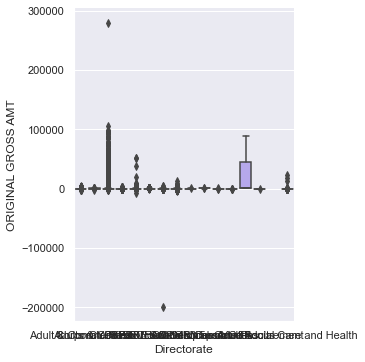

In [61]:
sns.catplot(x="Directorate", y="ORIGINAL GROSS AMT",
            kind="box", dodge=False, data=cat_df)

I was tinking about the outliers identification because, I was interested in characterize that type of movements that possibly are related with fraud movements.

In [62]:
cluster_dummy_try_df = directorate_time_1_df.reset_index(inplace=False)

In [63]:
cluster_dummy_try_df.columns = ["Directorate", "month_year", "sum", "mean", "count"]

In [64]:
cluster_dummy_try_df["Directorate"].unique()

array(['Adult & Communities', 'Adult Social Care and Health', 'Adults',
       'Adults & Comms', 'Adults & Communities', 'CYO&F', 'CYP&F',
       'CYP&F SCHOOLS', 'CYP&F Schools', 'Corporate Procurement',
       'Corporate Resources', 'DEVELOPMENT', 'Development',
       'Local Services', 'Local services'], dtype=object)

In [65]:
map_encoding = {
    'Adult & Communities': 1,
    'Adult Social Care and Health': 2,
    'Adults': 3,
    'Adults & Comms': 4,
    'Adults & Communities': 5,
    'CYO&F': 6,
    'CYP&F': 7,
    'CYP&F SCHOOLS': 8,
    'CYP&F Schools': 9,
    'Corporate Procurement': 10,
    'Corporate Resources': 11,
    'DEVELOPMENT': 12,
    'Development': 13,
    'Local Services': 14,
    'Local services': 15,
    "": 16,
    np.nan: 16
}

In [66]:
def map_encoding_directorate(x):
    return map_encoding[x]

In [67]:
map_encoding_category_temp = {
    
}

categories = unified_df["TRANS CAC DESC 1"].str.strip().unique()

for i in range(len(categories)):
    map_encoding_category_temp[str(categories[i])] = i + 1

In [68]:
map_encoding_category_temp

{'Vehicle Fuel': 1,
 'Training Other': 2,
 'Computing Other': 3,
 'Vehicle Excise Lics': 4,
 'Equip Other': 5,
 'Vehicle R&M': 6,
 'Books': 7,
 'Staff Advert Exp': 8,
 'Equip Operational': 9,
 'Supplies & Sev Mic': 10,
 'Stationery': 11,
 'Purchases Food': 12,
 'Bldg RM Departmental': 13,
 'Travel Bus/Rail': 14,
 'Hospitality': 15,
 'Vehicle OthrunCosts': 16,
 'Ttavel Other (UK)': 17,
 'Photocopying': 18,
 "Mat'l Raw/Drct": 19,
 'Postage': 20,
 'Travel Taxis': 21,
 'Prof Fees other': 22,
 'Other Fix&Fittings': 23,
 'Conference Fees Subs Foreign': 24,
 'Conference Fees Subs UK': 25,
 'Legal Fee Other': 26,
 'Equip Office': 27,
 'Electricity': 28,
 'Car Allowances etc': 29,
 'Travel Foreign': 30,
 "N'Papers&Periodicals": 31,
 'Phon NonCentrx Lines': 32,
 'Visits Expenditure': 33,
 'Other Services': 34,
 'Personal Needs': 35,
 'Clothing&Uniforms': 36,
 'HR&M Door Entry': 37,
 'Equip Maintenance': 38,
 'Licences & Permits': 39,
 'Stock Misc': 40,
 'Cleaning Materials': 41,
 'Subscriptions'

In [69]:
map_encoding_category_temp[np.nan] = 145

In [70]:
def map_encoding_category(x):
    return map_encoding_category_temp[x]

In [71]:
map_encoding_card_temp = {}
cards = unified_df["TRANS CAC DESC 1"].str.strip().unique()

for i in range(len(categories)):
    map_encoding_category_temp[str(categories[i])] = i + 1

I try to make a cluster charachterization of the spend with the k neiborhoods algorithm based in the directorate, but I do not find a relevant application of these aproach.

In [72]:
cluster_dummy_try_df

,Directorate,month_year,sum,mean,count
0,Adult & Communities,2013-11,-594.00,-594.000000,1
1,Adult & Communities,2014-04,21679.45,93.850433,231
2,Adult & Communities,2014-05,500.25,71.464286,7
3,Adult & Communities,2014-06,29344.76,59.643821,492
4,Adult & Communities,2014-07,16302.63,60.604572,269
5,Adult & Communities,2014-08,14301.50,63.562222,225
6,Adult & Communities,2014-09,17066.31,62.975314,271
7,Adult & Communities,2014-10,19727.23,67.559007,292
8,Adult & Communities,2014-11,14198.85,58.192008,244
9,Adult & Communities,2014-12,13035.65,57.936222,225


In [73]:
cluster_dummy_try_df["Directorate_encoded"] = cluster_dummy_try_df.apply(lambda x:  map_encoding_directorate(x["Directorate"]), axis=1)

In [74]:
cluster_dummy_try_df

,Directorate,month_year,sum,mean,count,Directorate_encoded
0,Adult & Communities,2013-11,-594.00,-594.000000,1,1
1,Adult & Communities,2014-04,21679.45,93.850433,231,1
2,Adult & Communities,2014-05,500.25,71.464286,7,1
3,Adult & Communities,2014-06,29344.76,59.643821,492,1
4,Adult & Communities,2014-07,16302.63,60.604572,269,1
5,Adult & Communities,2014-08,14301.50,63.562222,225,1
6,Adult & Communities,2014-09,17066.31,62.975314,271,1
7,Adult & Communities,2014-10,19727.23,67.559007,292,1
8,Adult & Communities,2014-11,14198.85,58.192008,244,1
9,Adult & Communities,2014-12,13035.65,57.936222,225,1


In [75]:
from sklearn.cluster import KMeans

In [76]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(cluster_dummy_try_df[["Directorate_encoded", "sum"]])

In [77]:
kmeans.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 2, 0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 2, 0, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

directorate vs total_spend in a cluster point of view

<AxesSubplot:xlabel='Directorate_encoded', ylabel='sum'>

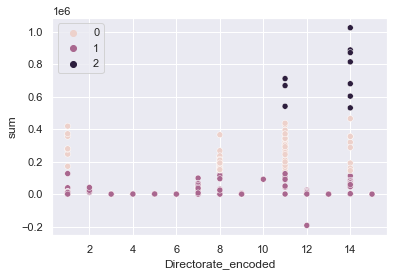

In [78]:
sns.scatterplot(data=cluster_dummy_try_df, x="Directorate_encoded", y="sum", hue=kmeans.labels_)

the same information with out clustering labels

<AxesSubplot:xlabel='Directorate_encoded', ylabel='mean'>

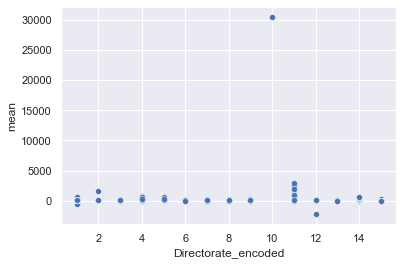

In [79]:
sns.scatterplot(data=cluster_dummy_try_df, x="Directorate_encoded", y="mean")

how the last process do not give good results I try again focussed in observe the all the data from a different point of view

In [80]:
unified_df.head()

,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS DATE,Directorate,MERCHANT NAME,TRANS CAC CODE 1,TRANS VAT DESC,TRANS CAC DESC 1,CARD NUMBER,ORIGINAL GROSS AMT,TRANS CAC CODE 3,month_year
0,RV12N,African-Caribbean DC,2014-04-29,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,52.32,A00,2014-04
1,RV12N,African-Caribbean DC,2014-04-04,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,65.82,A00,2014-04
2,RV11Y,"Marsh Lane Dce, 79, B23",2014-04-07,Adult & Communities,tesco pfs 2484,K020,VR,Vehicle Fuel,************8738,41.35,A00,2014-04
3,RV1K1,Elders Group - Erdington,2014-04-25,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,47.19,A00,2014-04
4,RV1K1,Elders Group - Erdington,2014-04-24,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,98.08,A00,2014-04


In [81]:
cluster_dummy_try_2_df = unified_df.copy()

In [82]:
cluster_dummy_try_2_df.head()

,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS DATE,Directorate,MERCHANT NAME,TRANS CAC CODE 1,TRANS VAT DESC,TRANS CAC DESC 1,CARD NUMBER,ORIGINAL GROSS AMT,TRANS CAC CODE 3,month_year
0,RV12N,African-Caribbean DC,2014-04-29,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,52.32,A00,2014-04
1,RV12N,African-Caribbean DC,2014-04-04,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,65.82,A00,2014-04
2,RV11Y,"Marsh Lane Dce, 79, B23",2014-04-07,Adult & Communities,tesco pfs 2484,K020,VR,Vehicle Fuel,************8738,41.35,A00,2014-04
3,RV1K1,Elders Group - Erdington,2014-04-25,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,47.19,A00,2014-04
4,RV1K1,Elders Group - Erdington,2014-04-24,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,98.08,A00,2014-04


I encoded the principal variables that I was thinking that are important for the custering task.

In [83]:
cluster_dummy_try_2_df["Directorate_encoded"] = cluster_dummy_try_2_df.apply(lambda x:  map_encoding_directorate(x["Directorate"]), axis=1)

In [84]:
cluster_dummy_try_2_df["category_encoded"] = cluster_dummy_try_2_df.apply(lambda x:  map_encoding_category(x["TRANS CAC DESC 1"]), axis=1)

In [85]:
cluster_dummy_try_2_df.head()

,TRANS CAC CODE 2,TRANS CAC DESC 2,TRANS DATE,Directorate,MERCHANT NAME,TRANS CAC CODE 1,TRANS VAT DESC,TRANS CAC DESC 1,CARD NUMBER,ORIGINAL GROSS AMT,TRANS CAC CODE 3,month_year,Directorate_encoded,category_encoded
0,RV12N,African-Caribbean DC,2014-04-29,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,52.32,A00,2014-04,1,1
1,RV12N,African-Caribbean DC,2014-04-04,Adult & Communities,shell kings 587,K020,VR,Vehicle Fuel,************5770,65.82,A00,2014-04,1,1
2,RV11Y,"Marsh Lane Dce, 79, B23",2014-04-07,Adult & Communities,tesco pfs 2484,K020,VR,Vehicle Fuel,************8738,41.35,A00,2014-04,1,1
3,RV1K1,Elders Group - Erdington,2014-04-25,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,47.19,A00,2014-04,1,1
4,RV1K1,Elders Group - Erdington,2014-04-24,Adult & Communities,bush service station,K020,VR,Vehicle Fuel,************2997,98.08,A00,2014-04,1,1


directorate vs spend in a single transaction

<AxesSubplot:xlabel='Directorate_encoded', ylabel='ORIGINAL GROSS AMT'>

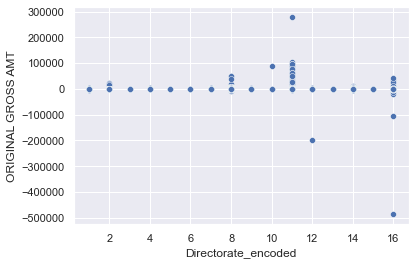

In [86]:
sns.scatterplot(data=cluster_dummy_try_2_df, x="Directorate_encoded", y="ORIGINAL GROSS AMT")

In [87]:
cluster_dummy_try_2_df["ORIGINAL GROSS AMT"] = cluster_dummy_try_2_df["ORIGINAL GROSS AMT"].fillna(0)

In [88]:
kmeans_Directorate = KMeans(n_clusters=5, random_state=0).fit(cluster_dummy_try_2_df[["ORIGINAL GROSS AMT", "Directorate_encoded"]])

In [89]:
kmeans_Directorate.labels_

array([0, 0, 0, ..., 0, 0, 0])

<AxesSubplot:xlabel='Directorate_encoded', ylabel='ORIGINAL GROSS AMT'>

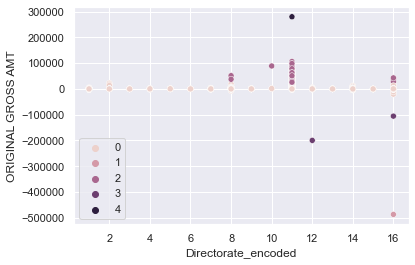

In [90]:
sns.scatterplot(data=cluster_dummy_try_2_df, x="Directorate_encoded", y="ORIGINAL GROSS AMT", hue=kmeans_Directorate.labels_)

I found that these representation of clustering do not have any sense, then I have an idea, then I try to see the data in another type of graphical representation like heat maps

category vs spend in a single transaction

<AxesSubplot:xlabel='category_encoded', ylabel='ORIGINAL GROSS AMT'>

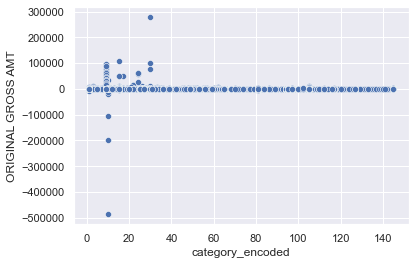

In [91]:
sns.scatterplot(data=cluster_dummy_try_2_df, x="category_encoded", y="ORIGINAL GROSS AMT")

then I try to visualize how are conected the directorate vs the category spend in a single transaction

<AxesSubplot:xlabel='Directorate_encoded', ylabel='category_encoded'>

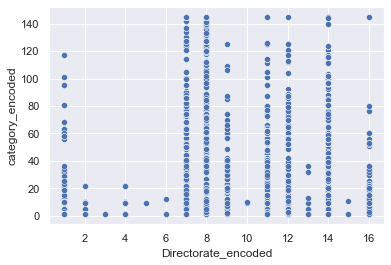

In [92]:
sns.scatterplot(data=cluster_dummy_try_2_df, x="Directorate_encoded", y="category_encoded")

ok, that culd be more significant if I try to see another variable like total spend, mean spend or number of transactions

In [93]:
heat_map_try = cluster_dummy_try_2_df[["Directorate_encoded", "category_encoded", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate_encoded", "category_encoded"]).agg("sum").reset_index(inplace=False)
heat_map_try.columns = ["Directorate_encoded", "category_encoded", "total_spend"]

In [94]:
heat_map_try

,Directorate_encoded,category_encoded,total_spend
0,1,1,482225.77
1,1,2,1711.00
2,1,3,4249.82
3,1,4,694.00
4,1,5,13801.66
5,1,6,1062.46
6,1,7,1479.40
7,1,8,332.49
8,1,9,34165.21
9,1,10,5368.04


directorate vs spend category vs total_spend

<AxesSubplot:xlabel='Directorate_encoded', ylabel='category_encoded'>

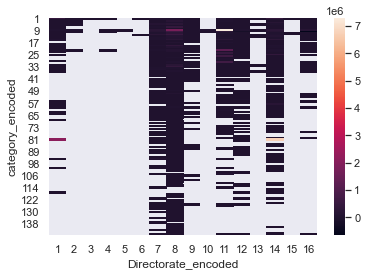

In [95]:
sns.heatmap(heat_map_try.pivot("category_encoded", "Directorate_encoded", "total_spend"))

In [96]:
heat_map_try_2 = cluster_dummy_try_2_df[["Directorate_encoded", "category_encoded", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate_encoded", "category_encoded"]).agg("mean").reset_index(inplace=False)
heat_map_try_2.columns = ["Directorate_encoded", "category_encoded", "mean_spend"]

directorate vs spend category vs avg_spend

<AxesSubplot:xlabel='Directorate_encoded', ylabel='category_encoded'>

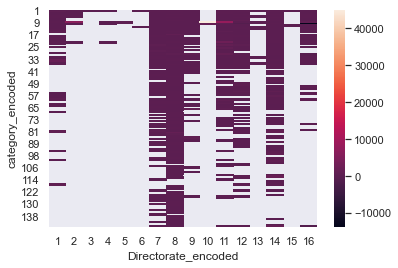

In [97]:
sns.heatmap(heat_map_try_2.pivot("category_encoded", "Directorate_encoded", "mean_spend"))

directorate vs spend category vs number_of_movements

<AxesSubplot:xlabel='Directorate_encoded', ylabel='category_encoded'>

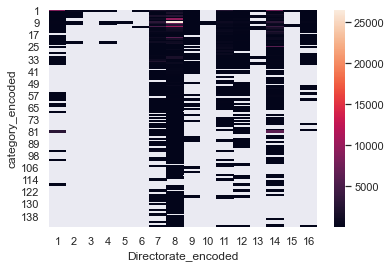

In [98]:
heat_map_try_3 = cluster_dummy_try_2_df[["Directorate_encoded", "category_encoded", "ORIGINAL GROSS AMT"]].groupby(by=["Directorate_encoded", "category_encoded"]).agg("count").reset_index(inplace=False)
heat_map_try_3.columns = ["Directorate_encoded", "category_encoded", "count"]
sns.heatmap(heat_map_try_3.pivot("category_encoded", "Directorate_encoded", "count"))

### model try

with the information learned, I develop an automating encoding process for the categorical data type, based in dictionaries for do the job.

In [99]:
def encoding_map_dict(df, column):
    map_encoding_column_temp = {}
    categories = df[column].str.strip().unique()
    for i in range(len(categories)):
        map_encoding_column_temp[str(categories[i])] = i
    map_encoding_column_temp[np.nan] = np.nan     
    return map_encoding_column_temp

In [100]:
unified_df[["TRANS CAC CODE 1", "TRANS CAC CODE 2", "Directorate", "CARD NUMBER", "ORIGINAL GROSS AMT", "month_year" ]].head()

,TRANS CAC CODE 1,TRANS CAC CODE 2,Directorate,CARD NUMBER,ORIGINAL GROSS AMT,month_year
0,K020,RV12N,Adult & Communities,************5770,52.32,2014-04
1,K020,RV12N,Adult & Communities,************5770,65.82,2014-04
2,K020,RV11Y,Adult & Communities,************8738,41.35,2014-04
3,K020,RV1K1,Adult & Communities,************2997,47.19,2014-04
4,K020,RV1K1,Adult & Communities,************2997,98.08,2014-04


after I make a new data but with the categorical data encoded by my dictionary based function

In [101]:
model_data_df = pd.DataFrame()

In [102]:
model_map_encoding_code_1_dic = encoding_map_dict(unified_df, "TRANS CAC CODE 1")
model_map_encoding_code_2_dic = encoding_map_dict(unified_df, "TRANS CAC CODE 2")
model_map_encoding_directorate_dic = encoding_map_dict(unified_df, "Directorate")
model_map_encoding_card_number_dic = encoding_map_dict(unified_df, "CARD NUMBER")

In [103]:
model_data_df["TRANS CAC CODE 1"] = unified_df["TRANS CAC CODE 1"].apply(lambda x: model_map_encoding_code_1_dic[x])
model_data_df["TRANS CAC CODE 2"] = unified_df["TRANS CAC CODE 2"].apply(lambda x: model_map_encoding_code_2_dic[x])
model_data_df["Directorate"] = unified_df["Directorate"].apply(lambda x: model_map_encoding_directorate_dic[x])
model_data_df["CARD NUMBER"] = unified_df["CARD NUMBER"].apply(lambda x: model_map_encoding_card_number_dic[x])
model_data_df["ORIGINAL GROSS AMT"] = unified_df["ORIGINAL GROSS AMT"]
model_data_df["month_year"] = unified_df["month_year"]

how I was thinking in a ML process, I take the desition of drop the null values because I do not consider apply an cast method for identify the possible candidates for fill the empty spaces.

In [104]:
model_data_df = model_data_df.dropna()

In [105]:
model_data_df.head(10)

,TRANS CAC CODE 1,TRANS CAC CODE 2,Directorate,CARD NUMBER,ORIGINAL GROSS AMT,month_year
0,0.0,0.0,0.0,0.0,52.32,2014-04
1,0.0,0.0,0.0,0.0,65.82,2014-04
2,0.0,1.0,0.0,1.0,41.35,2014-04
3,0.0,2.0,0.0,2.0,47.19,2014-04
4,0.0,2.0,0.0,2.0,98.08,2014-04
5,0.0,2.0,0.0,2.0,98.64,2014-04
6,0.0,2.0,0.0,2.0,68.24,2014-04
7,0.0,2.0,0.0,2.0,95.02,2014-04
8,0.0,2.0,0.0,2.0,56.54,2014-04
9,0.0,3.0,0.0,3.0,20.03,2014-04


after that I develop an automated filtering process for try diferent volumetry of data injected to the  ML models.

In [106]:
model_data_df["month_year"].unique()

<PeriodArray>
['2014-04', '2013-11', '2014-05', '2014-03', '2014-07', '2014-06', '2014-08',
 '2014-09', '2014-10', '2014-11', '2014-12', '2015-01', '2015-02', '2015-03',
 '2015-04', '2015-05', '2015-06', '2015-07', '2015-08', '2015-09', '2015-10',
 '2015-11', '2015-12', '2016-01', '2016-02', '2016-03', '2016-04', '2016-05',
 '2016-06', '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12',
 '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06', '2017-07',
 '2017-08', '2017-09', '2017-10', '2017-11', '2017-12', '2018-01', '2018-02']
Length: 49, dtype: period[M]

In [107]:
date_filter_list = [ '2014-04', '2014-05', '2014-06', '2014-07', '2014-08', '2014-09', '2014-10', '2014-11', '2014-12']

In [108]:
dates_for_filter = pd.to_datetime(pd.Series(date_filter_list), format="%Y-%m").dt.to_period('M')

In [109]:
model_data_filtered_df = model_data_df[model_data_df["month_year"].isin(dates_for_filter)]

In [110]:
model_data_filtered_df.head()

,TRANS CAC CODE 1,TRANS CAC CODE 2,Directorate,CARD NUMBER,ORIGINAL GROSS AMT,month_year
0,0.0,0.0,0.0,0.0,52.32,2014-04
1,0.0,0.0,0.0,0.0,65.82,2014-04
2,0.0,1.0,0.0,1.0,41.35,2014-04
3,0.0,2.0,0.0,2.0,47.19,2014-04
4,0.0,2.0,0.0,2.0,98.08,2014-04


In [111]:
model_data_filtered_df.shape[0]

34459

In [112]:
model_data_filtered_df["month_year"].unique()

<PeriodArray>
['2014-04', '2014-05', '2014-07', '2014-06', '2014-08', '2014-09', '2014-10',
 '2014-11', '2014-12']
Length: 9, dtype: period[M]

finally I developed an standard ML application, stating wwwith the segmentation of test and train data.

In [113]:
X_train, X_test, y_train, y_test = train_test_split(model_data_filtered_df[["TRANS CAC CODE 1", "TRANS CAC CODE 2", "Directorate", "CARD NUMBER"]], model_data_filtered_df["ORIGINAL GROSS AMT"], random_state=42, test_size=0.3)

In [114]:
X_train.shape[0]

24121

In [115]:
X_test.shape[0]

10338

In [116]:
y_train.shape[0]

24121

In [117]:
y_test.shape[0]

10338

In [118]:
X_train.head()

,TRANS CAC CODE 1,TRANS CAC CODE 2,Directorate,CARD NUMBER
977,11.0,726.0,3.0,934.0
2444,6.0,265.0,4.0,70.0
3303,32.0,229.0,4.0,424.0
454,0.0,59.0,2.0,900.0
550,8.0,83.0,3.0,131.0


In [119]:
y_train.head()

977      48.50
2444     16.93
3303    317.40
454      52.95
550      56.96
Name: ORIGINAL GROSS AMT, dtype: float64

finally I prove different type of ML models to figure out the best posibillity for do an ML regressor.

# Super Vector Machines SVR non linear kernel

In [120]:
from sklearn import svm
regr = svm.SVR()
regr.fit(X_train, y_train)

SVR()

In [121]:
regr.score(X_test, y_test)

-0.003916694388274244

# Super Vector Machines Linear Kernel

In [122]:
from sklearn.svm import LinearSVR
regr_2 = LinearSVR(random_state=0, tol=0.1, max_iter=5000)
regr_2.fit(X_train, y_train)

LinearSVR(max_iter=5000, random_state=0, tol=0.1)

In [123]:
regr.score(X_test, y_test)

-0.003916694388274244

# Tree Regresor

In [124]:
from sklearn import tree
clf = tree.DecisionTreeRegressor()
clf.fit(X_train, y_train)

DecisionTreeRegressor()

In [125]:
clf.score(X_test, y_test)

0.4820586569853441

In [126]:
from sklearn.model_selection import cross_val_score
cross_val_score(clf, X_test, y_test, cv=10)

array([  0.40764182,   0.86511902,   0.83354805,  -0.37537045,
         0.46878708,   0.34101399, -27.22969283,   0.59099692,
         0.39748321,   0.87878056])

# Linear Regression

In [127]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(X_train, y_train)

In [128]:
reg.score(X_test, y_test)

0.002452979949662093

# Multilayer Linear Perceptron 

In [132]:
from sklearn.neural_network import MLPRegressor
regr_MLP = MLPRegressor(random_state=1, max_iter=1000).fit(X_train, y_train)

C:\Users\carlo\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


In [133]:
regr.score(X_test, y_test)

-0.003916694388274244

all the models are bad regressors because the r^2 score metric are so bad, then predict with those models do not have any sense.

on another hand I think a fraud detection model based in a one type of regressor, that regressor is used for infer the amount of money in a transaction accorder with the input parameters. After we can use an expert model based in a normalizaion process, focused in the mean and variance of the spend amount in the series analisis by month grouped by Directorate. With that indicators variables in the data distribution,that was found in the time series analisys, is only nesesary convert the predicted spend value and the real transaction value ussing a normalization process. For do that, can be used the diferent mean and variance values found for each category described by Directorate. After that, the model only need a treshold for the distance between the predicted value in the normalized distribution of spends and the evaluated real transaction amount in the normalized distribution. The treshold are defined by the expert criterium.

Is so important have in mind that in these dataset, we only  have a single numeric variable, that are the amount tranasaction. That fact,  difficults the task of predict a transaction fraud activity, because for make the job, is normally used not oly transactional  product activity, is also requiered a  complementary information that have a lot of socioeconomic information, personal information, and bank associated product information like personal accounts balance, historically account movements, accounting asset and liabilities. 